# DATA EXTRACTION / MINNING / SCRAPING WITH BEAUTIFUL SOUP

In [1]:
# To be begin data extraction i imported the beautiful soup & request library  
from bs4 import BeautifulSoup
import requests

In [5]:
# pasted the URL of the webpage i want to extract
url = 'https://auction.nigeriatradehub.gov.ng/previous_auction.php'
page = requests.get(url)
soup = BeautifulSoup(page.text, 'html.parser')

In [6]:
print(soup)

<script>document.addEventListener("contextmenu", function(e) {    e.preventDefault();});</script><!DOCTYPE html>

<html lang="en">
<head>
<title>Previous Auction</title>
<meta charset="utf-8"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<meta content="eAuction" name="description"/>
<meta content="width=device-width, initial-scale=1" name="viewport"/>
<!-- Jquery Toast css -->
<link href="assets/libs/jquery-toast-plugin/jquery.toast.min.css" rel="stylesheet" type="text/css"/>
<!-- SweetAlert2 -->
<link href="assets/sweetalert2-theme-bootstrap-4/bootstrap-4.min.css" rel="stylesheet"/>
<!-- Toastr -->
<link href="assets/toastr/toastr.min.css" rel="stylesheet"/>
<link href="styles/bootstrap4/bootstrap.min.css" rel="stylesheet" type="text/css"/>
<link href="plugins/font-awesome-4.7.0/css/font-awesome.min.css" rel="stylesheet" type="text/css"/>
<link href="https://cdnjs.cloudflare.com/ajax/libs/font-awesome/6.4.2/css/all.min.css" rel="stylesheet"/>
<link href="plugins/OwlCarousel

In [37]:
# Scraped the first items from the first nodes on the webpage
from bs4 import BeautifulSoup
import requests

# for the URL
url = 'https://auction.nigeriatradehub.gov.ng/previous_auction.php'
page = requests.get(url)
soup = BeautifulSoup(page.text, 'html.parser')

# For the items and reference numbers extraction
link_tag = soup.find('div', class_='course_tag').find('a', href=True)
url = link_tag['href']
reference_number = link_tag.text.strip()

# For the bidding prices extraction
price_tag = soup.find('div', class_='course_price').find('span')
price = price_tag.text.strip()

# For the item title extraction
title_tag = soup.find('h5', class_='card-title')
car_title = title_tag.text.strip()

# For the item condition and VIN
details_tag = soup.find('p', class_='card-text')
details = details_tag.find_all('br')

# -1 for condition and 0 for VIN
condition = details_tag.text.split('<br/>')[-1].strip()
vin = details_tag.text.split('<br/>')[0].strip().split()[-1]


# Extraction of the transmission, mileage, and fuel type [0] for transmission, [1] for mileage, [2] for fuel type 
footer_tags = soup.find_all('a', class_='d-inline-block col text-dark')
transmission = footer_tags[0].find('span').text.strip() if len(footer_tags) > 0 else 'N/A'
mileage = footer_tags[1].find('span').text.strip() if len(footer_tags) > 1 else 'N/A'
fuel_type = footer_tags[2].find('span').text.strip() if len(footer_tags) > 2 else 'N/A'

# Output the extracted information
print(f"URL: {url}")
print(f"Reference Number: {reference_number}")
print(f"Price: {price}")
print(f"Car Title: {car_title}")
print(f"Condition: {condition}")
print(f"VIN: {vin}")
print(f"Transmission: {transmission}")
print(f"Mileage: {mileage}")
print(f"Fuel Type: {fuel_type}")


URL: previous_vehicle_details.php?refNo=1&itemType=Vehicle
Reference Number: NCS/PTML/OVT/01/24/1
Price: ₦892,000.00
Car Title: TOYOTA CAMRY HYBRID LE 4DR SEDAN 2006
Condition: Used 
 
							4T1BE32K86U111063
VIN: 4T1BE32K86U111063
Transmission: Automatic
Mileage: 0.00KM
Fuel Type: Petrol


In [18]:
# Tried scraping all the items from all the pages on the website but was unsuccessful
import requests
from bs4 import BeautifulSoup

# using user defined fuction to extract data from the html pages
def extract_data_from_html(html):
    soup = BeautifulSoup(html, 'html.parser')
    
    # For the items and reference numbers extraction
    link_tag = soup.find('div', class_='course_tag').find('a', href=True)
    url = link_tag['href']
    reference_number = link_tag.text.strip()

   # For the bidding prices extraction
    price_tag = soup.find('div', class_='course_price').find('span')
    price = price_tag.text.strip()

   # For the item title extraction
    title_tag = soup.find('h5', class_='card-title')
    car_title = title_tag.text.strip()

   #  For the item condition and VIN
    details_tag = soup.find('p', class_='card-text')
    details = details_tag.find_all('br')
   
   # -1 for condition and 0 for VIN
    VIN = details_tag.text.split('<br/>')[0].strip().split()[-1]
    Condition = details_tag.text.split('<br/>')[-1].strip()
    
    # # Extraction of the transmission, mileage, and fuel type [0] for transmission, [1] for mileage, [2] for fuel type 
    footer_tags = soup.find_all('a', class_='d-inline-block col text-dark')
    transmission = footer_tags[0].find('span').text.strip() if len(footer_tags) > 0 else 'N/A'
    mileage = footer_tags[1].find('span').text.strip() if len(footer_tags) > 1 else 'N/A'
    fuel_type = footer_tags[2].find('span').text.strip() if len(footer_tags) > 2 else 'N/A'

    
    return {
        'URL': url,
        'Reference Number': reference_number,
        'Price': price,
        'Car Title': car_title,
        'Condition': Condition,
        'VIN': VIN,
        'Transmission': transmission,
        'Mileage': mileage,
        'Fuel Type': fuel_type
    }

# user defined fuction to scrap the 38 pages
def scrape_multiple_pages(urls):
    data = []
    for url in urls:
        try:
            # Fetch the page
            response = requests.get(url)
            response.raise_for_status()  # Check for request errors

            # Extract data from the HTML content
            page_data = extract_data_from_html(response.text)
            data.append(page_data)

            print(f"Data extracted from {url}: {page_data}")

        except requests.RequestException as e:
            print(f"Failed to retrieve data from {url}: {e}")

    return data

# List of URLs to scrape
urls = [
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=2',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=3',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=4',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=5',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=6',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=7',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=8',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=9',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=10',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=11',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=12',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=13',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=14',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=15',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=16',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=17',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=18',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=19',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=20',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=21',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=22',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=23',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=24',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=25',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=26',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=27',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=28',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=29',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=30',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=31',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=32',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=33',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=34',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=35',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=36',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=37',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=38'
]

# Start scraping the data
scraped_data = scrape_multiple_pages(urls)




Data extracted from https://auction.nigeriatradehub.gov.ng/previous_auction.php: {'URL': 'previous_vehicle_details.php?refNo=1&itemType=Vehicle', 'Reference Number': 'NCS/PTML/OVT/01/24/1', 'Price': '₦892,000.00', 'Car Title': 'TOYOTA CAMRY HYBRID LE 4DR SEDAN 2006', 'Condition': 'Used \n \n\t\t\t\t\t\t\t4T1BE32K86U111063', 'VIN': '4T1BE32K86U111063', 'Transmission': 'Automatic', 'Mileage': '0.00KM', 'Fuel Type': 'Petrol'}
Data extracted from https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=2: {'URL': 'previous_vehicle_details.php?refNo=37&itemType=Vehicle', 'Reference Number': 'NCS/PTML/OVT/01/24/37', 'Price': '₦450,000.00', 'Car Title': 'MAZDA MAZDA 5 2005', 'Condition': 'Used \n \n\t\t\t\t\t\t\tJMZCR198260114972', 'VIN': 'JMZCR198260114972', 'Transmission': 'Automatic', 'Mileage': '0.00KM', 'Fuel Type': 'Petrol'}
Data extracted from https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=3: {'URL': 'previous_vehicle_details.php?refNo=72&itemType=Vehicle', 'R

In [19]:
# imported the pandas library
import pandas as pd

auction = pd.DataFrame(scraped_data)
print(auction)

                                                  URL  \
0   previous_vehicle_details.php?refNo=1&itemType=...   
1   previous_vehicle_details.php?refNo=37&itemType...   
2   previous_vehicle_details.php?refNo=72&itemType...   
3   previous_vehicle_details.php?refNo=106&itemTyp...   
4   previous_vehicle_details.php?refNo=140&itemTyp...   
5   previous_vehicle_details.php?refNo=174&itemTyp...   
6   previous_vehicle_details.php?refNo=295&itemTyp...   
7   previous_vehicle_details.php?refNo=249&itemTyp...   
8    container_details.php?refNo=4&itemType=Container   
9   previous_vehicle_details.php?refNo=345&itemTyp...   
10  previous_vehicle_details.php?refNo=307&itemTyp...   
11  container_details.php?refNo=23&itemType=Container   
12  previous_vehicle_details.php?refNo=128&itemTyp...   
13  previous_vehicle_details.php?refNo=416&itemTyp...   
14  previous_vehicle_details.php?refNo=451&itemTyp...   
15  previous_vehicle_details.php?refNo=480&itemTyp...   
16  previous_vehicle_details.ph

In [24]:
# Edited my code to scrap all the data from the website 
import requests
from bs4 import BeautifulSoup
import pandas as pd

def extract_data_from_html(html):
    soup = BeautifulSoup(html, 'html.parser')
    data = []

    # Find all the blocks that contain the information in each node from all the 38 pages
    car_blocks = soup.find_all('div', class_='card')

    for block in car_blocks:
        # For the items and reference numbers extraction
        link_tag = block.find('div', class_='course_tag').find('a', href=True)
        url = link_tag['href']
        reference_number = link_tag.text.strip()

        # For the bidding prices extraction
        price_tag = block.find('div', class_='course_price').find('span')
        price = price_tag.text.strip()

        # For the item title extraction
        title_tag = block.find('h5', class_='card-title')
        car_title = title_tag.text.strip()

        #  For the item condition and VIN
        details_tag = block.find('p', class_='card-text')
        details = details_tag.get_text(separator=' ').strip().split()
        
        #-1 for condition and 0 for VIN
        vin = details[0] if len(details) > 0 else 'N/A'
        condition = details[-1] if len(details) > 1 else 'N/A'

         # # Extraction of the transmission, mileage, and fuel type [0] for transmission, [1] for mileage, [2] for fuel type 
        footer_tags = block.find_all('a', class_='d-inline-block col text-dark')
        transmission = footer_tags[0].find('span').text.strip() if len(footer_tags) > 0 else 'N/A'
        mileage = footer_tags[1].find('span').text.strip() if len(footer_tags) > 1 else 'N/A'
        fuel_type = footer_tags[2].find('span').text.strip() if len(footer_tags) > 2 else 'N/A'

        # after getting the data show the results below
        data.append({
            'URL': url,
            'Reference Number': reference_number,
            'Price': price,
            'Car Title': car_title,
            'Condition': condition,
            'VIN': vin,
            'Transmission': transmission,
            'Mileage': mileage,
            'Fuel Type': fuel_type
        })

    return data

def scrape_multiple_pages(urls):
    all_data = []
    
    # run a for loop in the urls 
    for url in urls:
        try:
            response = requests.get(url)
            response.raise_for_status()  # Check for request errors

            page_data = extract_data_from_html(response.text)
            all_data.extend(page_data)

            print(f"Data extracted from {url}")

        except requests.RequestException as e:
            print(f"Failed to retrieve data from {url}: {e}")

    return all_data

# List of URLs to scrape
urls = [
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=2',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=3',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=4',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=5',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=6',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=7',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=8',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=9',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=10',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=11',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=12',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=13',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=14',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=15',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=16',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=17',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=18',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=19',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=20',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=21',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=22',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=23',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=24',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=25',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=26',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=27',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=28',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=29',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=30',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=31',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=32',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=33',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=34',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=35',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=36',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=37',
    'https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=38'
    # Add more URLs as needed
]

# Start the scraping process
scraped_data = scrape_multiple_pages(urls)

Data extracted from https://auction.nigeriatradehub.gov.ng/previous_auction.php
Data extracted from https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=2
Data extracted from https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=3
Data extracted from https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=4
Data extracted from https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=5
Data extracted from https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=6
Data extracted from https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=7
Data extracted from https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=8
Data extracted from https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=9
Data extracted from https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=10
Data extracted from https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=11
Data extracted from https://auction.nigeriatrade

In [25]:
# After scraping, printed the data to the console
scrapped_data = scrape_multiple_pages(urls)

# Print the extracted data
for entry in scrapped_data:
    print(entry)

Data extracted from https://auction.nigeriatradehub.gov.ng/previous_auction.php
Data extracted from https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=2
Data extracted from https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=3
Data extracted from https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=4
Data extracted from https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=5
Data extracted from https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=6
Data extracted from https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=7
Data extracted from https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=8
Data extracted from https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=9
Data extracted from https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=10
Data extracted from https://auction.nigeriatradehub.gov.ng/previous_auction.php?page=11
Data extracted from https://auction.nigeriatrade

In [36]:
# finally scraped all the data i needed
import pandas as pd

bidding = pd.DataFrame(scrapped_data)
print(bidding)

                                                    URL  \
0     previous_vehicle_details.php?refNo=1&itemType=...   
1     previous_vehicle_details.php?refNo=2&itemType=...   
2     previous_vehicle_details.php?refNo=3&itemType=...   
3     previous_vehicle_details.php?refNo=4&itemType=...   
4     previous_vehicle_details.php?refNo=5&itemType=...   
...                                                 ...   
1200  previous_vehicle_details.php?refNo=1178&itemTy...   
1201  previous_vehicle_details.php?refNo=1179&itemTy...   
1202  previous_vehicle_details.php?refNo=1180&itemTy...   
1203  previous_vehicle_details.php?refNo=1181&itemTy...   
1204  previous_vehicle_details.php?refNo=1182&itemTy...   

               Reference Number          Price  \
0          NCS/PTML/OVT/01/24/1    ₦892,000.00   
1          NCS/PTML/OVT/01/24/2    ₦500,000.00   
2          NCS/PTML/OVT/01/24/3    ₦420,000.00   
3          NCS/PTML/OVT/01/24/4    ₦800,000.00   
4          NCS/PTML/OVT/01/24/5    ₦715,0

In [38]:
from IPython.display import display

# Display the DataFrame as an HTML table in Jupyter
display(bidding)

,URL,Reference Number,Price,Car Title,Condition,VIN,Transmission,Mileage,Fuel Type
0,previous_vehicle_details.php?refNo=1&itemType=...,NCS/PTML/OVT/01/24/1,"₦892,000.00",TOYOTA CAMRY HYBRID LE 4DR SEDAN 2006,4T1BE32K86U111063,Used,Automatic,0.00KM,Petrol
1,previous_vehicle_details.php?refNo=2&itemType=...,NCS/PTML/OVT/01/24/2,"₦500,000.00",ACURA TL 2004,19UUA66214A013030,Used,Automatic,0.00KM,Petrol
2,previous_vehicle_details.php?refNo=3&itemType=...,NCS/PTML/OVT/01/24/3,"₦420,000.00",HONDA ACCORD EX 1.5T 4DR SEDAN 2004,1HGCM66554A098192,Used,Automatic,0.00KM,Petrol
3,previous_vehicle_details.php?refNo=4&itemType=...,NCS/PTML/OVT/01/24/4,"₦800,000.00",TOYOTA COROLLA L 4DR SEDAN 2007,2T1BR32E27C777272,Used,Automatic,0.00KM,Petrol
4,previous_vehicle_details.php?refNo=5&itemType=...,NCS/PTML/OVT/01/24/5,"₦715,000.00",PEUGEOT 307 2008,VF33CNFUL84568049,Used,Automatic,0.00KM,Petrol
...,...,...,...,...,...,...,...,...,...
1200,previous_vehicle_details.php?refNo=1178&itemTy...,NCS/TCIP/OVT/08/2024/1178,"₦648,000.00",FORD FREESTAR 2004,B29970,Used,Automatic,0.00KM,Petrol
1201,previous_vehicle_details.php?refNo=1179&itemTy...,NCS/TCIP/OVT/08/2024/1179,"₦1,200,000.00",TOYOTA HIGHLANDER 2012,5TDYK3EH5CS070513,Used,Automatic,0.00KM,Petrol
1202,previous_vehicle_details.php?refNo=1180&itemTy...,NCS/TCIP/OVT/08/2024/1180,"₦1,626,898.00",HONDA CROSSTOUR 2014,000016,Used,Automatic,0.00KM,Petrol
1203,previous_vehicle_details.php?refNo=1181&itemTy...,NCS/TCIP/OVT/08/2024/1181,"₦533,333.00",HYUNDAI SANTA FE 2004,U572121,Used,Automatic,0.00KM,Petrol


In [44]:
# save your result as CSV file
bidding.to_csv('C:\\Users\HP\Desktop\Phyton for everybody with Dr Chuck\\Scrapped_Data\Scrapped_bidding_data.csv')
print('Table saved as "Scrapped_bidding_data"')

Table saved as "Scrapped_bidding_data"


In [36]:
# View my data in a dataframe
import pandas as pd
import numpy as np

auction_results = pd.read_csv('C:\\Users\\HP\\Desktop\\Phyton for everybody with Dr Chuck\\Scrapped_Data\\Unclean_Raw_Scrapped_bidding_data.csv')
auction_results


,Unnamed: 0,URL,Reference Number,Price,Car Title,Condition,VIN,Transmission,Mileage,Fuel Type
0,0,previous_vehicle_details.php?refNo=1&itemType=...,NCS/PTML/OVT/01/24/1,"₦892,000.00",TOYOTA CAMRY HYBRID LE 4DR SEDAN 2006,4T1BE32K86U111063,Used,Automatic,0.00KM,Petrol
1,1,previous_vehicle_details.php?refNo=2&itemType=...,NCS/PTML/OVT/01/24/2,"₦500,000.00",ACURA TL 2004,19UUA66214A013030,Used,Automatic,0.00KM,Petrol
2,2,previous_vehicle_details.php?refNo=3&itemType=...,NCS/PTML/OVT/01/24/3,"₦420,000.00",HONDA ACCORD EX 1.5T 4DR SEDAN 2004,1HGCM66554A098192,Used,Automatic,0.00KM,Petrol
3,3,previous_vehicle_details.php?refNo=4&itemType=...,NCS/PTML/OVT/01/24/4,"₦800,000.00",TOYOTA COROLLA L 4DR SEDAN 2007,2T1BR32E27C777272,Used,Automatic,0.00KM,Petrol
4,4,previous_vehicle_details.php?refNo=5&itemType=...,NCS/PTML/OVT/01/24/5,"₦715,000.00",PEUGEOT 307 2008,VF33CNFUL84568049,Used,Automatic,0.00KM,Petrol
...,...,...,...,...,...,...,...,...,...,...
1200,1200,previous_vehicle_details.php?refNo=1178&itemTy...,NCS/TCIP/OVT/08/2024/1178,"₦648,000.00",FORD FREESTAR 2004,B29970,Used,Automatic,0.00KM,Petrol
1201,1201,previous_vehicle_details.php?refNo=1179&itemTy...,NCS/TCIP/OVT/08/2024/1179,"₦1,200,000.00",TOYOTA HIGHLANDER 2012,5TDYK3EH5CS070513,Used,Automatic,0.00KM,Petrol
1202,1202,previous_vehicle_details.php?refNo=1180&itemTy...,NCS/TCIP/OVT/08/2024/1180,"₦1,626,898.00",HONDA CROSSTOUR 2014,000016,Used,Automatic,0.00KM,Petrol
1203,1203,previous_vehicle_details.php?refNo=1181&itemTy...,NCS/TCIP/OVT/08/2024/1181,"₦533,333.00",HYUNDAI SANTA FE 2004,U572121,Used,Automatic,0.00KM,Petrol


# DATA CLEANING WITH PANDAS AND NUMPY


In [37]:
# I cleaned the first row called URL by extracting only bidding items which were either a vehicle or a container
auction_results['URL']

0       previous_vehicle_details.php?refNo=1&itemType=...
1       previous_vehicle_details.php?refNo=2&itemType=...
2       previous_vehicle_details.php?refNo=3&itemType=...
3       previous_vehicle_details.php?refNo=4&itemType=...
4       previous_vehicle_details.php?refNo=5&itemType=...
                              ...                        
1200    previous_vehicle_details.php?refNo=1178&itemTy...
1201    previous_vehicle_details.php?refNo=1179&itemTy...
1202    previous_vehicle_details.php?refNo=1180&itemTy...
1203    previous_vehicle_details.php?refNo=1181&itemTy...
1204    previous_vehicle_details.php?refNo=1182&itemTy...
Name: URL, Length: 1205, dtype: object

In [38]:
auction_results['URL'].to_frame()

,URL
0,previous_vehicle_details.php?refNo=1&itemType=...
1,previous_vehicle_details.php?refNo=2&itemType=...
2,previous_vehicle_details.php?refNo=3&itemType=...
3,previous_vehicle_details.php?refNo=4&itemType=...
4,previous_vehicle_details.php?refNo=5&itemType=...
...,...
1200,previous_vehicle_details.php?refNo=1178&itemTy...
1201,previous_vehicle_details.php?refNo=1179&itemTy...
1202,previous_vehicle_details.php?refNo=1180&itemTy...
1203,previous_vehicle_details.php?refNo=1181&itemTy...


In [4]:
#split all the rows in the URL column to extract the text we want which in this case is the last text
auction_results['URL'] = auction_results['URL'].apply(lambda a: a.split('=')[-1])

print(auction_results)


      Unnamed: 0      URL           Reference Number          Price  \
0              0  Vehicle       NCS/PTML/OVT/01/24/1    ₦892,000.00   
1              1  Vehicle       NCS/PTML/OVT/01/24/2    ₦500,000.00   
2              2  Vehicle       NCS/PTML/OVT/01/24/3    ₦420,000.00   
3              3  Vehicle       NCS/PTML/OVT/01/24/4    ₦800,000.00   
4              4  Vehicle       NCS/PTML/OVT/01/24/5    ₦715,000.00   
...          ...      ...                        ...            ...   
1200        1200  Vehicle  NCS/TCIP/OVT/08/2024/1178    ₦648,000.00   
1201        1201  Vehicle  NCS/TCIP/OVT/08/2024/1179  ₦1,200,000.00   
1202        1202  Vehicle  NCS/TCIP/OVT/08/2024/1180  ₦1,626,898.00   
1203        1203  Vehicle  NCS/TCIP/OVT/08/2024/1181    ₦533,333.00   
1204        1204  Vehicle  NCS/TCIP/OVT/08/2024/1182    ₦520,000.00   

                                  Car Title          Condition   VIN  \
0     TOYOTA CAMRY HYBRID LE 4DR SEDAN 2006  4T1BE32K86U111063  Used   
1  

In [5]:
auction_results['URL'] = 'Vehicle'

auction_results['URL'].to_frame()

,URL
0,Vehicle
1,Vehicle
2,Vehicle
3,Vehicle
4,Vehicle
...,...
1200,Vehicle
1201,Vehicle
1202,Vehicle
1203,Vehicle


In [39]:
auction_results['URL'] = 'Container'
auction_results['URL'].to_frame()

,URL
0,Container
1,Container
2,Container
3,Container
4,Container
...,...
1200,Container
1201,Container
1202,Container
1203,Container


In [7]:

import pandas as pd

auction_results = pd.read_csv('C:\\Users\\HP\\Desktop\\Phyton for everybody with Dr Chuck\\Scrapped_Data\\Unclean_Raw_Scrapped_bidding_data.csv')
auction_results['URL'] = auction_results['URL'].apply(lambda a: a.split('=')[-1])
auction_results

print(auction_results)

      Unnamed: 0      URL           Reference Number          Price  \
0              0  Vehicle       NCS/PTML/OVT/01/24/1    ₦892,000.00   
1              1  Vehicle       NCS/PTML/OVT/01/24/2    ₦500,000.00   
2              2  Vehicle       NCS/PTML/OVT/01/24/3    ₦420,000.00   
3              3  Vehicle       NCS/PTML/OVT/01/24/4    ₦800,000.00   
4              4  Vehicle       NCS/PTML/OVT/01/24/5    ₦715,000.00   
...          ...      ...                        ...            ...   
1200        1200  Vehicle  NCS/TCIP/OVT/08/2024/1178    ₦648,000.00   
1201        1201  Vehicle  NCS/TCIP/OVT/08/2024/1179  ₦1,200,000.00   
1202        1202  Vehicle  NCS/TCIP/OVT/08/2024/1180  ₦1,626,898.00   
1203        1203  Vehicle  NCS/TCIP/OVT/08/2024/1181    ₦533,333.00   
1204        1204  Vehicle  NCS/TCIP/OVT/08/2024/1182    ₦520,000.00   

                                  Car Title          Condition   VIN  \
0     TOYOTA CAMRY HYBRID LE 4DR SEDAN 2006  4T1BE32K86U111063  Used   
1  

In [40]:
from IPython.display import display
import pandas as pd

auction_results = pd.read_csv('C:\\Users\\HP\\Desktop\\Phyton for everybody with Dr Chuck\\Scrapped_Data\\Unclean_Raw_Scrapped_bidding_data.csv')
auction_results['URL'] = auction_results['URL'].apply(lambda a: a.split('=')[-1])

display(auction_results)

,Unnamed: 0,URL,Reference Number,Price,Car Title,Condition,VIN,Transmission,Mileage,Fuel Type
0,0,Vehicle,NCS/PTML/OVT/01/24/1,"₦892,000.00",TOYOTA CAMRY HYBRID LE 4DR SEDAN 2006,4T1BE32K86U111063,Used,Automatic,0.00KM,Petrol
1,1,Vehicle,NCS/PTML/OVT/01/24/2,"₦500,000.00",ACURA TL 2004,19UUA66214A013030,Used,Automatic,0.00KM,Petrol
2,2,Vehicle,NCS/PTML/OVT/01/24/3,"₦420,000.00",HONDA ACCORD EX 1.5T 4DR SEDAN 2004,1HGCM66554A098192,Used,Automatic,0.00KM,Petrol
3,3,Vehicle,NCS/PTML/OVT/01/24/4,"₦800,000.00",TOYOTA COROLLA L 4DR SEDAN 2007,2T1BR32E27C777272,Used,Automatic,0.00KM,Petrol
4,4,Vehicle,NCS/PTML/OVT/01/24/5,"₦715,000.00",PEUGEOT 307 2008,VF33CNFUL84568049,Used,Automatic,0.00KM,Petrol
...,...,...,...,...,...,...,...,...,...,...
1200,1200,Vehicle,NCS/TCIP/OVT/08/2024/1178,"₦648,000.00",FORD FREESTAR 2004,B29970,Used,Automatic,0.00KM,Petrol
1201,1201,Vehicle,NCS/TCIP/OVT/08/2024/1179,"₦1,200,000.00",TOYOTA HIGHLANDER 2012,5TDYK3EH5CS070513,Used,Automatic,0.00KM,Petrol
1202,1202,Vehicle,NCS/TCIP/OVT/08/2024/1180,"₦1,626,898.00",HONDA CROSSTOUR 2014,000016,Used,Automatic,0.00KM,Petrol
1203,1203,Vehicle,NCS/TCIP/OVT/08/2024/1181,"₦533,333.00",HYUNDAI SANTA FE 2004,U572121,Used,Automatic,0.00KM,Petrol


In [41]:
# Changing the Condition column values whose name will be changed in the future
# it is vital to know that the Condition column is supposed to be the TIN and vice versa
# Give the values in Condition Column some meaning

auction_results['Condition'].replace({'Nigeria': 'Cont23456'}, inplace=True)

auction_results

,Unnamed: 0,URL,Reference Number,Price,Car Title,Condition,VIN,Transmission,Mileage,Fuel Type
0,0,Vehicle,NCS/PTML/OVT/01/24/1,"₦892,000.00",TOYOTA CAMRY HYBRID LE 4DR SEDAN 2006,4T1BE32K86U111063,Used,Automatic,0.00KM,Petrol
1,1,Vehicle,NCS/PTML/OVT/01/24/2,"₦500,000.00",ACURA TL 2004,19UUA66214A013030,Used,Automatic,0.00KM,Petrol
2,2,Vehicle,NCS/PTML/OVT/01/24/3,"₦420,000.00",HONDA ACCORD EX 1.5T 4DR SEDAN 2004,1HGCM66554A098192,Used,Automatic,0.00KM,Petrol
3,3,Vehicle,NCS/PTML/OVT/01/24/4,"₦800,000.00",TOYOTA COROLLA L 4DR SEDAN 2007,2T1BR32E27C777272,Used,Automatic,0.00KM,Petrol
4,4,Vehicle,NCS/PTML/OVT/01/24/5,"₦715,000.00",PEUGEOT 307 2008,VF33CNFUL84568049,Used,Automatic,0.00KM,Petrol
...,...,...,...,...,...,...,...,...,...,...
1200,1200,Vehicle,NCS/TCIP/OVT/08/2024/1178,"₦648,000.00",FORD FREESTAR 2004,B29970,Used,Automatic,0.00KM,Petrol
1201,1201,Vehicle,NCS/TCIP/OVT/08/2024/1179,"₦1,200,000.00",TOYOTA HIGHLANDER 2012,5TDYK3EH5CS070513,Used,Automatic,0.00KM,Petrol
1202,1202,Vehicle,NCS/TCIP/OVT/08/2024/1180,"₦1,626,898.00",HONDA CROSSTOUR 2014,000016,Used,Automatic,0.00KM,Petrol
1203,1203,Vehicle,NCS/TCIP/OVT/08/2024/1181,"₦533,333.00",HYUNDAI SANTA FE 2004,U572121,Used,Automatic,0.00KM,Petrol


In [42]:
auction_results['Condition'] = 'Cont23456'

auction_results['Condition'].to_frame()

,Condition
0,Cont23456
1,Cont23456
2,Cont23456
3,Cont23456
4,Cont23456
...,...
1200,Cont23456
1201,Cont23456
1202,Cont23456
1203,Cont23456


In [43]:
# Changing the TIN column values whose name will be changed in the future
# it is vital to know that the TIN column is supposed to be the condition and vice versa

auction_results['VIN'].replace({'Used': 'Used_Vehicle', 'Accidented': 'Used_Vehicle', '0KG': 'Used_Items_In_Container', 
                                  '1,020KG': 'Used_items_In_Container', '19,958KG': 'Used_Items_In_Container'}, inplace=True)

auction_results

,Unnamed: 0,URL,Reference Number,Price,Car Title,Condition,VIN,Transmission,Mileage,Fuel Type
0,0,Vehicle,NCS/PTML/OVT/01/24/1,"₦892,000.00",TOYOTA CAMRY HYBRID LE 4DR SEDAN 2006,Cont23456,Used_Vehicle,Automatic,0.00KM,Petrol
1,1,Vehicle,NCS/PTML/OVT/01/24/2,"₦500,000.00",ACURA TL 2004,Cont23456,Used_Vehicle,Automatic,0.00KM,Petrol
2,2,Vehicle,NCS/PTML/OVT/01/24/3,"₦420,000.00",HONDA ACCORD EX 1.5T 4DR SEDAN 2004,Cont23456,Used_Vehicle,Automatic,0.00KM,Petrol
3,3,Vehicle,NCS/PTML/OVT/01/24/4,"₦800,000.00",TOYOTA COROLLA L 4DR SEDAN 2007,Cont23456,Used_Vehicle,Automatic,0.00KM,Petrol
4,4,Vehicle,NCS/PTML/OVT/01/24/5,"₦715,000.00",PEUGEOT 307 2008,Cont23456,Used_Vehicle,Automatic,0.00KM,Petrol
...,...,...,...,...,...,...,...,...,...,...
1200,1200,Vehicle,NCS/TCIP/OVT/08/2024/1178,"₦648,000.00",FORD FREESTAR 2004,Cont23456,Used_Vehicle,Automatic,0.00KM,Petrol
1201,1201,Vehicle,NCS/TCIP/OVT/08/2024/1179,"₦1,200,000.00",TOYOTA HIGHLANDER 2012,Cont23456,Used_Vehicle,Automatic,0.00KM,Petrol
1202,1202,Vehicle,NCS/TCIP/OVT/08/2024/1180,"₦1,626,898.00",HONDA CROSSTOUR 2014,Cont23456,Used_Vehicle,Automatic,0.00KM,Petrol
1203,1203,Vehicle,NCS/TCIP/OVT/08/2024/1181,"₦533,333.00",HYUNDAI SANTA FE 2004,Cont23456,Used_Vehicle,Automatic,0.00KM,Petrol


In [44]:
auction_results['VIN'].to_frame()

,VIN
0,Used_Vehicle
1,Used_Vehicle
2,Used_Vehicle
3,Used_Vehicle
4,Used_Vehicle
...,...
1200,Used_Vehicle
1201,Used_Vehicle
1202,Used_Vehicle
1203,Used_Vehicle


In [45]:
auction_results['VIN'] = 'Used_Items_In_Container'

auction_results['VIN'].to_frame()

,VIN
0,Used_Items_In_Container
1,Used_Items_In_Container
2,Used_Items_In_Container
3,Used_Items_In_Container
4,Used_Items_In_Container
...,...
1200,Used_Items_In_Container
1201,Used_Items_In_Container
1202,Used_Items_In_Container
1203,Used_Items_In_Container


In [46]:
# checking for isna values in the transmission column
auction_results['Transmission'].isna().values.any()

True

In [47]:
auction_results.loc[auction_results['Transmission'].isna()]

,Unnamed: 0,URL,Reference Number,Price,Car Title,Condition,VIN,Transmission,Mileage,Fuel Type
253,253,Container,NCS/TCIP/OVT/03/2024/1,"₦25,000,000.00",DFSU6276690,Cont23456,Used_Items_In_Container,NaN,NaN,NaN
254,254,Container,NCS/TCIP/OVT/03/2024/2,"₦19,000,500.00",CSNU6062890,Cont23456,Used_Items_In_Container,NaN,NaN,NaN
255,255,Container,NCS/TCIP/OVT/03/2024/3,"₦9,000,000.00",CBHU8708359,Cont23456,Used_Items_In_Container,NaN,NaN,NaN
256,256,Container,NCS/TCIP/OVT/03/2024/4,"₦8,700,000.00",CSNU6999438,Cont23456,Used_Items_In_Container,NaN,NaN,NaN
257,257,Container,NCS/TCIP/OVT/03/2024/5,"₦29,000,000.00",CBHU7069227,Cont23456,Used_Items_In_Container,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
710,710,Container,NCS/PTML/OVT/03/2024/109,"₦1,999,766.00",CSNU6979220,Cont23456,Used_Items_In_Container,NaN,NaN,NaN
711,711,Container,NCS/PTML/OVT/03/2024/110,"₦1,700,000.00",PCIU0169958,Cont23456,Used_Items_In_Container,NaN,NaN,NaN
712,712,Container,NCS/PTML/OVT/03/2024/111,"₦4,511,100.00",ACLU9779415,Cont23456,Used_Items_In_Container,NaN,NaN,NaN
713,713,Container,NCS/PTML/OVT/03/2024/112,"₦3,677,777.00",GCNU1220147,Cont23456,Used_Items_In_Container,NaN,NaN,NaN


In [50]:
# Give the values in the Transmission Column some meaning
auction_results['Transmission'].replace({'AUTOMATIC': 'Automatic_Vehicle', 'Automatic': 'Automatic_Vehicle', 
                                         'Manual': 'Manual_Vehicle'}, inplace=True)

auction_results

,Unnamed: 0,URL,Reference Number,Price,Car Title,Condition,VIN,Transmission,Mileage,Fuel Type
0,0,Vehicle,NCS/PTML/OVT/01/24/1,"₦892,000.00",TOYOTA CAMRY HYBRID LE 4DR SEDAN 2006,Cont23456,Used_Items_In_Container,Automatic_Vehicle,0.00KM,Petrol
1,1,Vehicle,NCS/PTML/OVT/01/24/2,"₦500,000.00",ACURA TL 2004,Cont23456,Used_Items_In_Container,Automatic_Vehicle,0.00KM,Petrol
2,2,Vehicle,NCS/PTML/OVT/01/24/3,"₦420,000.00",HONDA ACCORD EX 1.5T 4DR SEDAN 2004,Cont23456,Used_Items_In_Container,Automatic_Vehicle,0.00KM,Petrol
3,3,Vehicle,NCS/PTML/OVT/01/24/4,"₦800,000.00",TOYOTA COROLLA L 4DR SEDAN 2007,Cont23456,Used_Items_In_Container,Automatic_Vehicle,0.00KM,Petrol
4,4,Vehicle,NCS/PTML/OVT/01/24/5,"₦715,000.00",PEUGEOT 307 2008,Cont23456,Used_Items_In_Container,Automatic_Vehicle,0.00KM,Petrol
...,...,...,...,...,...,...,...,...,...,...
1200,1200,Vehicle,NCS/TCIP/OVT/08/2024/1178,"₦648,000.00",FORD FREESTAR 2004,Cont23456,Used_Items_In_Container,Automatic_Vehicle,0.00KM,Petrol
1201,1201,Vehicle,NCS/TCIP/OVT/08/2024/1179,"₦1,200,000.00",TOYOTA HIGHLANDER 2012,Cont23456,Used_Items_In_Container,Automatic_Vehicle,0.00KM,Petrol
1202,1202,Vehicle,NCS/TCIP/OVT/08/2024/1180,"₦1,626,898.00",HONDA CROSSTOUR 2014,Cont23456,Used_Items_In_Container,Automatic_Vehicle,0.00KM,Petrol
1203,1203,Vehicle,NCS/TCIP/OVT/08/2024/1181,"₦533,333.00",HYUNDAI SANTA FE 2004,Cont23456,Used_Items_In_Container,Automatic_Vehicle,0.00KM,Petrol


In [51]:
# Replacing NaN values
auction_results['Transmission'] = auction_results['Transmission'].fillna('Container_Like').replace('NaN', 'Container_Like')

auction_results

,Unnamed: 0,URL,Reference Number,Price,Car Title,Condition,VIN,Transmission,Mileage,Fuel Type
0,0,Vehicle,NCS/PTML/OVT/01/24/1,"₦892,000.00",TOYOTA CAMRY HYBRID LE 4DR SEDAN 2006,Cont23456,Used_Items_In_Container,Automatic_Vehicle,0.00KM,Petrol
1,1,Vehicle,NCS/PTML/OVT/01/24/2,"₦500,000.00",ACURA TL 2004,Cont23456,Used_Items_In_Container,Automatic_Vehicle,0.00KM,Petrol
2,2,Vehicle,NCS/PTML/OVT/01/24/3,"₦420,000.00",HONDA ACCORD EX 1.5T 4DR SEDAN 2004,Cont23456,Used_Items_In_Container,Automatic_Vehicle,0.00KM,Petrol
3,3,Vehicle,NCS/PTML/OVT/01/24/4,"₦800,000.00",TOYOTA COROLLA L 4DR SEDAN 2007,Cont23456,Used_Items_In_Container,Automatic_Vehicle,0.00KM,Petrol
4,4,Vehicle,NCS/PTML/OVT/01/24/5,"₦715,000.00",PEUGEOT 307 2008,Cont23456,Used_Items_In_Container,Automatic_Vehicle,0.00KM,Petrol
...,...,...,...,...,...,...,...,...,...,...
1200,1200,Vehicle,NCS/TCIP/OVT/08/2024/1178,"₦648,000.00",FORD FREESTAR 2004,Cont23456,Used_Items_In_Container,Automatic_Vehicle,0.00KM,Petrol
1201,1201,Vehicle,NCS/TCIP/OVT/08/2024/1179,"₦1,200,000.00",TOYOTA HIGHLANDER 2012,Cont23456,Used_Items_In_Container,Automatic_Vehicle,0.00KM,Petrol
1202,1202,Vehicle,NCS/TCIP/OVT/08/2024/1180,"₦1,626,898.00",HONDA CROSSTOUR 2014,Cont23456,Used_Items_In_Container,Automatic_Vehicle,0.00KM,Petrol
1203,1203,Vehicle,NCS/TCIP/OVT/08/2024/1181,"₦533,333.00",HYUNDAI SANTA FE 2004,Cont23456,Used_Items_In_Container,Automatic_Vehicle,0.00KM,Petrol


In [53]:
auction_results.loc[auction_results['Transmission'].isna()]

,Unnamed: 0,URL,Reference Number,Price,Car Title,Condition,VIN,Transmission,Mileage,Fuel Type


In [54]:
auction_results['Transmission'].to_frame()

,Transmission
0,Automatic_Vehicle
1,Automatic_Vehicle
2,Automatic_Vehicle
3,Automatic_Vehicle
4,Automatic_Vehicle
...,...
1200,Automatic_Vehicle
1201,Automatic_Vehicle
1202,Automatic_Vehicle
1203,Automatic_Vehicle


In [55]:
auction_results['Transmission'] = 'Manual_Vehicle'

auction_results['Transmission'].to_frame()

,Transmission
0,Manual_Vehicle
1,Manual_Vehicle
2,Manual_Vehicle
3,Manual_Vehicle
4,Manual_Vehicle
...,...
1200,Manual_Vehicle
1201,Manual_Vehicle
1202,Manual_Vehicle
1203,Manual_Vehicle


In [56]:
auction_results['Transmission'] = 'Container_Like'

auction_results['Transmission'].to_frame()

,Transmission
0,Container_Like
1,Container_Like
2,Container_Like
3,Container_Like
4,Container_Like
...,...
1200,Container_Like
1201,Container_Like
1202,Container_Like
1203,Container_Like


In [57]:
# checking for isna values in the mileage column
auction_results['Mileage'].isna().values.any()

True

In [58]:
auction_results.loc[auction_results['Mileage'].isna()]

,Unnamed: 0,URL,Reference Number,Price,Car Title,Condition,VIN,Transmission,Mileage,Fuel Type
253,253,Container,NCS/TCIP/OVT/03/2024/1,"₦25,000,000.00",DFSU6276690,Cont23456,Used_Items_In_Container,Container_Like,NaN,NaN
254,254,Container,NCS/TCIP/OVT/03/2024/2,"₦19,000,500.00",CSNU6062890,Cont23456,Used_Items_In_Container,Container_Like,NaN,NaN
255,255,Container,NCS/TCIP/OVT/03/2024/3,"₦9,000,000.00",CBHU8708359,Cont23456,Used_Items_In_Container,Container_Like,NaN,NaN
256,256,Container,NCS/TCIP/OVT/03/2024/4,"₦8,700,000.00",CSNU6999438,Cont23456,Used_Items_In_Container,Container_Like,NaN,NaN
257,257,Container,NCS/TCIP/OVT/03/2024/5,"₦29,000,000.00",CBHU7069227,Cont23456,Used_Items_In_Container,Container_Like,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
710,710,Container,NCS/PTML/OVT/03/2024/109,"₦1,999,766.00",CSNU6979220,Cont23456,Used_Items_In_Container,Container_Like,NaN,NaN
711,711,Container,NCS/PTML/OVT/03/2024/110,"₦1,700,000.00",PCIU0169958,Cont23456,Used_Items_In_Container,Container_Like,NaN,NaN
712,712,Container,NCS/PTML/OVT/03/2024/111,"₦4,511,100.00",ACLU9779415,Cont23456,Used_Items_In_Container,Container_Like,NaN,NaN
713,713,Container,NCS/PTML/OVT/03/2024/112,"₦3,677,777.00",GCNU1220147,Cont23456,Used_Items_In_Container,Container_Like,NaN,NaN


In [59]:
# Give the values in the Mileage Column some meaning

auction_results['Mileage'].replace({'0.00KM': 'Kilometers'}, inplace=True)

auction_results

,Unnamed: 0,URL,Reference Number,Price,Car Title,Condition,VIN,Transmission,Mileage,Fuel Type
0,0,Vehicle,NCS/PTML/OVT/01/24/1,"₦892,000.00",TOYOTA CAMRY HYBRID LE 4DR SEDAN 2006,Cont23456,Used_Items_In_Container,Container_Like,Kilometers,Petrol
1,1,Vehicle,NCS/PTML/OVT/01/24/2,"₦500,000.00",ACURA TL 2004,Cont23456,Used_Items_In_Container,Container_Like,Kilometers,Petrol
2,2,Vehicle,NCS/PTML/OVT/01/24/3,"₦420,000.00",HONDA ACCORD EX 1.5T 4DR SEDAN 2004,Cont23456,Used_Items_In_Container,Container_Like,Kilometers,Petrol
3,3,Vehicle,NCS/PTML/OVT/01/24/4,"₦800,000.00",TOYOTA COROLLA L 4DR SEDAN 2007,Cont23456,Used_Items_In_Container,Container_Like,Kilometers,Petrol
4,4,Vehicle,NCS/PTML/OVT/01/24/5,"₦715,000.00",PEUGEOT 307 2008,Cont23456,Used_Items_In_Container,Container_Like,Kilometers,Petrol
...,...,...,...,...,...,...,...,...,...,...
1200,1200,Vehicle,NCS/TCIP/OVT/08/2024/1178,"₦648,000.00",FORD FREESTAR 2004,Cont23456,Used_Items_In_Container,Container_Like,Kilometers,Petrol
1201,1201,Vehicle,NCS/TCIP/OVT/08/2024/1179,"₦1,200,000.00",TOYOTA HIGHLANDER 2012,Cont23456,Used_Items_In_Container,Container_Like,Kilometers,Petrol
1202,1202,Vehicle,NCS/TCIP/OVT/08/2024/1180,"₦1,626,898.00",HONDA CROSSTOUR 2014,Cont23456,Used_Items_In_Container,Container_Like,Kilometers,Petrol
1203,1203,Vehicle,NCS/TCIP/OVT/08/2024/1181,"₦533,333.00",HYUNDAI SANTA FE 2004,Cont23456,Used_Items_In_Container,Container_Like,Kilometers,Petrol


In [60]:
# Replacing NaN values
auction_results['Mileage'] = auction_results['Mileage'].fillna('None').replace('NaN', 'None')

auction_results

,Unnamed: 0,URL,Reference Number,Price,Car Title,Condition,VIN,Transmission,Mileage,Fuel Type
0,0,Vehicle,NCS/PTML/OVT/01/24/1,"₦892,000.00",TOYOTA CAMRY HYBRID LE 4DR SEDAN 2006,Cont23456,Used_Items_In_Container,Container_Like,Kilometers,Petrol
1,1,Vehicle,NCS/PTML/OVT/01/24/2,"₦500,000.00",ACURA TL 2004,Cont23456,Used_Items_In_Container,Container_Like,Kilometers,Petrol
2,2,Vehicle,NCS/PTML/OVT/01/24/3,"₦420,000.00",HONDA ACCORD EX 1.5T 4DR SEDAN 2004,Cont23456,Used_Items_In_Container,Container_Like,Kilometers,Petrol
3,3,Vehicle,NCS/PTML/OVT/01/24/4,"₦800,000.00",TOYOTA COROLLA L 4DR SEDAN 2007,Cont23456,Used_Items_In_Container,Container_Like,Kilometers,Petrol
4,4,Vehicle,NCS/PTML/OVT/01/24/5,"₦715,000.00",PEUGEOT 307 2008,Cont23456,Used_Items_In_Container,Container_Like,Kilometers,Petrol
...,...,...,...,...,...,...,...,...,...,...
1200,1200,Vehicle,NCS/TCIP/OVT/08/2024/1178,"₦648,000.00",FORD FREESTAR 2004,Cont23456,Used_Items_In_Container,Container_Like,Kilometers,Petrol
1201,1201,Vehicle,NCS/TCIP/OVT/08/2024/1179,"₦1,200,000.00",TOYOTA HIGHLANDER 2012,Cont23456,Used_Items_In_Container,Container_Like,Kilometers,Petrol
1202,1202,Vehicle,NCS/TCIP/OVT/08/2024/1180,"₦1,626,898.00",HONDA CROSSTOUR 2014,Cont23456,Used_Items_In_Container,Container_Like,Kilometers,Petrol
1203,1203,Vehicle,NCS/TCIP/OVT/08/2024/1181,"₦533,333.00",HYUNDAI SANTA FE 2004,Cont23456,Used_Items_In_Container,Container_Like,Kilometers,Petrol


In [61]:
auction_results.loc[auction_results['Mileage'].isna()]

,Unnamed: 0,URL,Reference Number,Price,Car Title,Condition,VIN,Transmission,Mileage,Fuel Type


In [62]:
auction_results['Mileage'].to_frame()

,Mileage
0,Kilometers
1,Kilometers
2,Kilometers
3,Kilometers
4,Kilometers
...,...
1200,Kilometers
1201,Kilometers
1202,Kilometers
1203,Kilometers


In [64]:
auction_results['Mileage'] = 'None'

auction_results['Mileage'].to_frame()

,Mileage
0,None
1,None
2,None
3,None
4,None
...,...
1200,None
1201,None
1202,None
1203,None


In [65]:
# checking if there are NaN values in the fuel type column
auction_results.loc[auction_results['Fuel Type'].isna()]

,Unnamed: 0,URL,Reference Number,Price,Car Title,Condition,VIN,Transmission,Mileage,Fuel Type
14,14,Vehicle,NCS/PTML/OVT/01/24/18,"₦550,000.00",MERCEDES-BENZ C240 2005,Cont23456,Used_Items_In_Container,Container_Like,None,NaN
18,18,Vehicle,NCS/PTML/OVT/01/24/22,"₦1,800,000.00",TOYOTA YARIS SEDAN L 4DR SEDAN 2007,Cont23456,Used_Items_In_Container,Container_Like,None,NaN
20,20,Vehicle,NCS/PTML/OVT/01/24/25,"₦425,000.00",MERCEDES-BENZ C180 2002,Cont23456,Used_Items_In_Container,Container_Like,None,NaN
46,46,Vehicle,NCS/PTML/OVT/01/24/55,"₦660,000.00",MERCEDES-BENZ C200 2002,Cont23456,Used_Items_In_Container,Container_Like,None,NaN
55,55,Vehicle,NCS/PTML/OVT/01/24/66,"₦430,000.00",MERCEDES-BENZ C180 2006,Cont23456,Used_Items_In_Container,Container_Like,None,NaN
...,...,...,...,...,...,...,...,...,...,...
710,710,Container,NCS/PTML/OVT/03/2024/109,"₦1,999,766.00",CSNU6979220,Cont23456,Used_Items_In_Container,Container_Like,None,NaN
711,711,Container,NCS/PTML/OVT/03/2024/110,"₦1,700,000.00",PCIU0169958,Cont23456,Used_Items_In_Container,Container_Like,None,NaN
712,712,Container,NCS/PTML/OVT/03/2024/111,"₦4,511,100.00",ACLU9779415,Cont23456,Used_Items_In_Container,Container_Like,None,NaN
713,713,Container,NCS/PTML/OVT/03/2024/112,"₦3,677,777.00",GCNU1220147,Cont23456,Used_Items_In_Container,Container_Like,None,NaN


In [66]:
# Give the values in the Fuel Type Column some meaning
auction_results['Fuel Type'].replace({ 'Petrol': 'Petrol_Vehicle', 'PETROL': 'Petrol_Vehicle', 'NIL': 'Petrol_Vehicle'},
                                     inplace=True)
auction_results

,Unnamed: 0,URL,Reference Number,Price,Car Title,Condition,VIN,Transmission,Mileage,Fuel Type
0,0,Vehicle,NCS/PTML/OVT/01/24/1,"₦892,000.00",TOYOTA CAMRY HYBRID LE 4DR SEDAN 2006,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
1,1,Vehicle,NCS/PTML/OVT/01/24/2,"₦500,000.00",ACURA TL 2004,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
2,2,Vehicle,NCS/PTML/OVT/01/24/3,"₦420,000.00",HONDA ACCORD EX 1.5T 4DR SEDAN 2004,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
3,3,Vehicle,NCS/PTML/OVT/01/24/4,"₦800,000.00",TOYOTA COROLLA L 4DR SEDAN 2007,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
4,4,Vehicle,NCS/PTML/OVT/01/24/5,"₦715,000.00",PEUGEOT 307 2008,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
...,...,...,...,...,...,...,...,...,...,...
1200,1200,Vehicle,NCS/TCIP/OVT/08/2024/1178,"₦648,000.00",FORD FREESTAR 2004,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
1201,1201,Vehicle,NCS/TCIP/OVT/08/2024/1179,"₦1,200,000.00",TOYOTA HIGHLANDER 2012,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
1202,1202,Vehicle,NCS/TCIP/OVT/08/2024/1180,"₦1,626,898.00",HONDA CROSSTOUR 2014,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
1203,1203,Vehicle,NCS/TCIP/OVT/08/2024/1181,"₦533,333.00",HYUNDAI SANTA FE 2004,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle


In [105]:
# Used indexing starting from 0 to fill blanks at specified rows

auction_results.at[14, 'Fuel Type']= 'Diesel_Vehicle'
auction_results.at[18, 'Fuel Type']= 'Diesel_Vehicle'
auction_results.at[20, 'Fuel Type']= 'Diesel_Vehicle'
auction_results.at[46, 'Fuel Type']= 'Diesel_Vehicle'
auction_results.at[55, 'Fuel Type']= 'Diesel_Vehicle'
auction_results.at[71, 'Fuel Type']= 'Diesel_Vehicle'


auction_results

,Bidding_Item,Reference_Number,Bid_Winning_Price,Bidding_Item_Title,Bid_Item_Identification_Number,Condition,Transmission_Type,Mileage,Fuel_Type,Fuel Type
0,Vehicle,NCS/PTML/OVT/01/24/1,892000.0,TOYOTA CAMRY HYBRID LE 4DR SEDAN 2006,4T1BE32K86U111063,Used_Vehicle,Automatic_Vehicle,Kilometers,Petrol_Vehicle,NaN
1,Vehicle,NCS/PTML/OVT/01/24/2,500000.0,ACURA TL 2004,19UUA66214A013030,Used_Vehicle,Automatic_Vehicle,Kilometers,Petrol_Vehicle,NaN
2,Vehicle,NCS/PTML/OVT/01/24/3,420000.0,HONDA ACCORD EX 1.5T 4DR SEDAN 2004,1HGCM66554A098192,Used_Vehicle,Automatic_Vehicle,Kilometers,Petrol_Vehicle,NaN
3,Vehicle,NCS/PTML/OVT/01/24/4,800000.0,TOYOTA COROLLA L 4DR SEDAN 2007,2T1BR32E27C777272,Used_Vehicle,Automatic_Vehicle,Kilometers,Petrol_Vehicle,NaN
4,Vehicle,NCS/PTML/OVT/01/24/5,715000.0,PEUGEOT 307 2008,VF33CNFUL84568049,Used_Vehicle,Automatic_Vehicle,Kilometers,Petrol_Vehicle,NaN
...,...,...,...,...,...,...,...,...,...,...
1200,Vehicle,NCS/TCIP/OVT/08/2024/1178,648000.0,FORD FREESTAR 2004,B29970,Used_Vehicle,Automatic_Vehicle,Kilometers,Petrol_Vehicle,NaN
1201,Vehicle,NCS/TCIP/OVT/08/2024/1179,1200000.0,TOYOTA HIGHLANDER 2012,5TDYK3EH5CS070513,Used_Vehicle,Automatic_Vehicle,Kilometers,Petrol_Vehicle,NaN
1202,Vehicle,NCS/TCIP/OVT/08/2024/1180,1626898.0,HONDA CROSSTOUR 2014,000016,Used_Vehicle,Automatic_Vehicle,Kilometers,Petrol_Vehicle,NaN
1203,Vehicle,NCS/TCIP/OVT/08/2024/1181,533333.0,HYUNDAI SANTA FE 2004,U572121,Used_Vehicle,Automatic_Vehicle,Kilometers,Petrol_Vehicle,NaN


In [68]:
# Replacing NaN values
auction_results['Fuel Type'] = auction_results['Fuel Type'].fillna('None').replace('NaN', 'None')

auction_results

,Unnamed: 0,URL,Reference Number,Price,Car Title,Condition,VIN,Transmission,Mileage,Fuel Type
0,0,Vehicle,NCS/PTML/OVT/01/24/1,"₦892,000.00",TOYOTA CAMRY HYBRID LE 4DR SEDAN 2006,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
1,1,Vehicle,NCS/PTML/OVT/01/24/2,"₦500,000.00",ACURA TL 2004,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
2,2,Vehicle,NCS/PTML/OVT/01/24/3,"₦420,000.00",HONDA ACCORD EX 1.5T 4DR SEDAN 2004,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
3,3,Vehicle,NCS/PTML/OVT/01/24/4,"₦800,000.00",TOYOTA COROLLA L 4DR SEDAN 2007,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
4,4,Vehicle,NCS/PTML/OVT/01/24/5,"₦715,000.00",PEUGEOT 307 2008,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
...,...,...,...,...,...,...,...,...,...,...
1200,1200,Vehicle,NCS/TCIP/OVT/08/2024/1178,"₦648,000.00",FORD FREESTAR 2004,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
1201,1201,Vehicle,NCS/TCIP/OVT/08/2024/1179,"₦1,200,000.00",TOYOTA HIGHLANDER 2012,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
1202,1202,Vehicle,NCS/TCIP/OVT/08/2024/1180,"₦1,626,898.00",HONDA CROSSTOUR 2014,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
1203,1203,Vehicle,NCS/TCIP/OVT/08/2024/1181,"₦533,333.00",HYUNDAI SANTA FE 2004,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle


In [76]:
auction_results.loc[auction_results['Fuel Type'].isna()]

,Unnamed: 0,URL,Reference Number,Price,Car Title,Condition,VIN,Transmission,Mileage,Fuel Type


In [71]:
# Giving the values in the fuel type column some meaning
auction_results['Fuel Type'] = auction_results['Fuel Type'].replace(('Diesel_Vehicle',), 'Diesel_Vehicle', inplace=True)

auction_results

,Unnamed: 0,URL,Reference Number,Price,Car Title,Condition,VIN,Transmission,Mileage,Fuel Type
0,0,Vehicle,NCS/PTML/OVT/01/24/1,"₦892,000.00",TOYOTA CAMRY HYBRID LE 4DR SEDAN 2006,Cont23456,Used_Items_In_Container,Container_Like,None,None
1,1,Vehicle,NCS/PTML/OVT/01/24/2,"₦500,000.00",ACURA TL 2004,Cont23456,Used_Items_In_Container,Container_Like,None,None
2,2,Vehicle,NCS/PTML/OVT/01/24/3,"₦420,000.00",HONDA ACCORD EX 1.5T 4DR SEDAN 2004,Cont23456,Used_Items_In_Container,Container_Like,None,None
3,3,Vehicle,NCS/PTML/OVT/01/24/4,"₦800,000.00",TOYOTA COROLLA L 4DR SEDAN 2007,Cont23456,Used_Items_In_Container,Container_Like,None,None
4,4,Vehicle,NCS/PTML/OVT/01/24/5,"₦715,000.00",PEUGEOT 307 2008,Cont23456,Used_Items_In_Container,Container_Like,None,None
...,...,...,...,...,...,...,...,...,...,...
1200,1200,Vehicle,NCS/TCIP/OVT/08/2024/1178,"₦648,000.00",FORD FREESTAR 2004,Cont23456,Used_Items_In_Container,Container_Like,None,None
1201,1201,Vehicle,NCS/TCIP/OVT/08/2024/1179,"₦1,200,000.00",TOYOTA HIGHLANDER 2012,Cont23456,Used_Items_In_Container,Container_Like,None,None
1202,1202,Vehicle,NCS/TCIP/OVT/08/2024/1180,"₦1,626,898.00",HONDA CROSSTOUR 2014,Cont23456,Used_Items_In_Container,Container_Like,None,None
1203,1203,Vehicle,NCS/TCIP/OVT/08/2024/1181,"₦533,333.00",HYUNDAI SANTA FE 2004,Cont23456,Used_Items_In_Container,Container_Like,None,None


In [72]:
auction_results['Fuel Type'] = 'None'

auction_results['Fuel Type'].to_frame()

,Fuel Type
0,None
1,None
2,None
3,None
4,None
...,...
1200,None
1201,None
1202,None
1203,None


In [73]:
auction_results['Fuel Type'] = 'Diesel_Vehicle'

auction_results['Fuel Type'].to_frame()

,Fuel Type
0,Diesel_Vehicle
1,Diesel_Vehicle
2,Diesel_Vehicle
3,Diesel_Vehicle
4,Diesel_Vehicle
...,...
1200,Diesel_Vehicle
1201,Diesel_Vehicle
1202,Diesel_Vehicle
1203,Diesel_Vehicle


In [74]:
auction_results['Fuel Type'] = 'Petrol_Vehicle'

auction_results['Fuel Type'].to_frame()

,Fuel Type
0,Petrol_Vehicle
1,Petrol_Vehicle
2,Petrol_Vehicle
3,Petrol_Vehicle
4,Petrol_Vehicle
...,...
1200,Petrol_Vehicle
1201,Petrol_Vehicle
1202,Petrol_Vehicle
1203,Petrol_Vehicle


In [77]:
# Change the columnn names to make it corresepond to the column values changes made
auction_results.rename(columns={'URL':'Bidding_Item', 'Reference Number':'Reference_Number', 
                            'Price':'Bid_Winning_Price', 'Car Title':'Bidding_Item_Title',
                            'Condition':'Bid_Item_Identification_Number', 'VIN':'Condition',
                            'Transmission':'Transmission_Type', 'Fuel Type':'Fuel_Type'}, inplace=True)

auction_results

,Unnamed: 0,Bidding_Item,Reference_Number,Bid_Winning_Price,Bidding_Item_Title,Bid_Item_Identification_Number,Condition,Transmission_Type,Mileage,Fuel_Type
0,0,Vehicle,NCS/PTML/OVT/01/24/1,"₦892,000.00",TOYOTA CAMRY HYBRID LE 4DR SEDAN 2006,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
1,1,Vehicle,NCS/PTML/OVT/01/24/2,"₦500,000.00",ACURA TL 2004,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
2,2,Vehicle,NCS/PTML/OVT/01/24/3,"₦420,000.00",HONDA ACCORD EX 1.5T 4DR SEDAN 2004,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
3,3,Vehicle,NCS/PTML/OVT/01/24/4,"₦800,000.00",TOYOTA COROLLA L 4DR SEDAN 2007,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
4,4,Vehicle,NCS/PTML/OVT/01/24/5,"₦715,000.00",PEUGEOT 307 2008,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
...,...,...,...,...,...,...,...,...,...,...
1200,1200,Vehicle,NCS/TCIP/OVT/08/2024/1178,"₦648,000.00",FORD FREESTAR 2004,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
1201,1201,Vehicle,NCS/TCIP/OVT/08/2024/1179,"₦1,200,000.00",TOYOTA HIGHLANDER 2012,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
1202,1202,Vehicle,NCS/TCIP/OVT/08/2024/1180,"₦1,626,898.00",HONDA CROSSTOUR 2014,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
1203,1203,Vehicle,NCS/TCIP/OVT/08/2024/1181,"₦533,333.00",HYUNDAI SANTA FE 2004,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle


In [78]:
auction_results.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1205 entries, 0 to 1204
Data columns (total 10 columns):
 #   Column                          Non-Null Count  Dtype 
---  ------                          --------------  ----- 
 0   Unnamed: 0                      1205 non-null   int64 
 1   Bidding_Item                    1205 non-null   object
 2   Reference_Number                1205 non-null   object
 3   Bid_Winning_Price               1205 non-null   object
 4   Bidding_Item_Title              1205 non-null   object
 5   Bid_Item_Identification_Number  1205 non-null   object
 6   Condition                       1205 non-null   object
 7   Transmission_Type               1205 non-null   object
 8   Mileage                         1205 non-null   object
 9   Fuel_Type                       1205 non-null   object
dtypes: int64(1), object(9)
memory usage: 94.3+ KB


In [79]:
auction_results.dtypes

Unnamed: 0                         int64
Bidding_Item                      object
Reference_Number                  object
Bid_Winning_Price                 object
Bidding_Item_Title                object
Bid_Item_Identification_Number    object
Condition                         object
Transmission_Type                 object
Mileage                           object
Fuel_Type                         object
dtype: object

In [80]:
# checked if the the reference number column have strictly unique rows
auction_results['Reference_Number'].value_counts()

Reference_Number
NCS/01TC/OVT/02/2024/522     2
NCS/PTML/OVT/04/2024/856     2
NCS/PTML/OVT/02/2024/363     2
NCS/PTML/OVT/01/2024/258     2
NCS/01TC/OVT/02/2024/442     2
                            ..
NCS/PTML/OVT/01/2024/290     1
NCS/PTML/OVT/01/2024/287     1
NCS/PTML/OVT/01/2024/286     1
NCS/PTML/OVT/01/2024/284     1
NCS/TCIP/OVT/08/2024/1182    1
Name: count, Length: 1198, dtype: int64

In [81]:
auction_results['Reference_Number'].unique()

array(['NCS/PTML/OVT/01/24/1', 'NCS/PTML/OVT/01/24/2',
       'NCS/PTML/OVT/01/24/3', ..., 'NCS/TCIP/OVT/08/2024/1180',
       'NCS/TCIP/OVT/08/2024/1181', 'NCS/TCIP/OVT/08/2024/1182'],
      dtype=object)

In [82]:
# compare the number of unique values in the reference column to the length of the table
auction_results['Reference_Number'].nunique() == len(auction_results)

False

In [83]:
# Made the unnamed column an index
auction_results.index = auction_results['Unnamed: 0']
auction_results

,Unnamed: 0,Bidding_Item,Reference_Number,Bid_Winning_Price,Bidding_Item_Title,Bid_Item_Identification_Number,Condition,Transmission_Type,Mileage,Fuel_Type
Unnamed: 0,,,,,,,,,,
0,0,Vehicle,NCS/PTML/OVT/01/24/1,"₦892,000.00",TOYOTA CAMRY HYBRID LE 4DR SEDAN 2006,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
1,1,Vehicle,NCS/PTML/OVT/01/24/2,"₦500,000.00",ACURA TL 2004,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
2,2,Vehicle,NCS/PTML/OVT/01/24/3,"₦420,000.00",HONDA ACCORD EX 1.5T 4DR SEDAN 2004,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
3,3,Vehicle,NCS/PTML/OVT/01/24/4,"₦800,000.00",TOYOTA COROLLA L 4DR SEDAN 2007,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
4,4,Vehicle,NCS/PTML/OVT/01/24/5,"₦715,000.00",PEUGEOT 307 2008,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
...,...,...,...,...,...,...,...,...,...,...
1200,1200,Vehicle,NCS/TCIP/OVT/08/2024/1178,"₦648,000.00",FORD FREESTAR 2004,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
1201,1201,Vehicle,NCS/TCIP/OVT/08/2024/1179,"₦1,200,000.00",TOYOTA HIGHLANDER 2012,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
1202,1202,Vehicle,NCS/TCIP/OVT/08/2024/1180,"₦1,626,898.00",HONDA CROSSTOUR 2014,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle


In [84]:
# Dropped the unnamed column 
auction_results = auction_results.drop(['Unnamed: 0'], axis=1)
auction_results

,Bidding_Item,Reference_Number,Bid_Winning_Price,Bidding_Item_Title,Bid_Item_Identification_Number,Condition,Transmission_Type,Mileage,Fuel_Type
Unnamed: 0,,,,,,,,,
0,Vehicle,NCS/PTML/OVT/01/24/1,"₦892,000.00",TOYOTA CAMRY HYBRID LE 4DR SEDAN 2006,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
1,Vehicle,NCS/PTML/OVT/01/24/2,"₦500,000.00",ACURA TL 2004,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
2,Vehicle,NCS/PTML/OVT/01/24/3,"₦420,000.00",HONDA ACCORD EX 1.5T 4DR SEDAN 2004,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
3,Vehicle,NCS/PTML/OVT/01/24/4,"₦800,000.00",TOYOTA COROLLA L 4DR SEDAN 2007,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
4,Vehicle,NCS/PTML/OVT/01/24/5,"₦715,000.00",PEUGEOT 307 2008,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
...,...,...,...,...,...,...,...,...,...
1200,Vehicle,NCS/TCIP/OVT/08/2024/1178,"₦648,000.00",FORD FREESTAR 2004,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
1201,Vehicle,NCS/TCIP/OVT/08/2024/1179,"₦1,200,000.00",TOYOTA HIGHLANDER 2012,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
1202,Vehicle,NCS/TCIP/OVT/08/2024/1180,"₦1,626,898.00",HONDA CROSSTOUR 2014,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle


In [85]:
# reset the entire index
auction_results.reset_index(drop=True, inplace=True)
auction_results

,Bidding_Item,Reference_Number,Bid_Winning_Price,Bidding_Item_Title,Bid_Item_Identification_Number,Condition,Transmission_Type,Mileage,Fuel_Type
0,Vehicle,NCS/PTML/OVT/01/24/1,"₦892,000.00",TOYOTA CAMRY HYBRID LE 4DR SEDAN 2006,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
1,Vehicle,NCS/PTML/OVT/01/24/2,"₦500,000.00",ACURA TL 2004,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
2,Vehicle,NCS/PTML/OVT/01/24/3,"₦420,000.00",HONDA ACCORD EX 1.5T 4DR SEDAN 2004,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
3,Vehicle,NCS/PTML/OVT/01/24/4,"₦800,000.00",TOYOTA COROLLA L 4DR SEDAN 2007,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
4,Vehicle,NCS/PTML/OVT/01/24/5,"₦715,000.00",PEUGEOT 307 2008,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
...,...,...,...,...,...,...,...,...,...
1200,Vehicle,NCS/TCIP/OVT/08/2024/1178,"₦648,000.00",FORD FREESTAR 2004,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
1201,Vehicle,NCS/TCIP/OVT/08/2024/1179,"₦1,200,000.00",TOYOTA HIGHLANDER 2012,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
1202,Vehicle,NCS/TCIP/OVT/08/2024/1180,"₦1,626,898.00",HONDA CROSSTOUR 2014,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
1203,Vehicle,NCS/TCIP/OVT/08/2024/1181,"₦533,333.00",HYUNDAI SANTA FE 2004,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle


In [86]:
# Changing the data types of the neccesary columns 
auction_results.dtypes

Bidding_Item                      object
Reference_Number                  object
Bid_Winning_Price                 object
Bidding_Item_Title                object
Bid_Item_Identification_Number    object
Condition                         object
Transmission_Type                 object
Mileage                           object
Fuel_Type                         object
dtype: object

In [87]:
# Was having issues changing the data type of the Bid winning 
#price therefore i had to replace the naira signs and commas to empty spaces
auction_results['Bid_Winning_Price'] = auction_results['Bid_Winning_Price'].replace({'₦': '', ',': ''},
                                       regex=True).astype(float)

auction_results


,Bidding_Item,Reference_Number,Bid_Winning_Price,Bidding_Item_Title,Bid_Item_Identification_Number,Condition,Transmission_Type,Mileage,Fuel_Type
0,Vehicle,NCS/PTML/OVT/01/24/1,892000.0,TOYOTA CAMRY HYBRID LE 4DR SEDAN 2006,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
1,Vehicle,NCS/PTML/OVT/01/24/2,500000.0,ACURA TL 2004,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
2,Vehicle,NCS/PTML/OVT/01/24/3,420000.0,HONDA ACCORD EX 1.5T 4DR SEDAN 2004,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
3,Vehicle,NCS/PTML/OVT/01/24/4,800000.0,TOYOTA COROLLA L 4DR SEDAN 2007,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
4,Vehicle,NCS/PTML/OVT/01/24/5,715000.0,PEUGEOT 307 2008,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
...,...,...,...,...,...,...,...,...,...
1200,Vehicle,NCS/TCIP/OVT/08/2024/1178,648000.0,FORD FREESTAR 2004,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
1201,Vehicle,NCS/TCIP/OVT/08/2024/1179,1200000.0,TOYOTA HIGHLANDER 2012,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
1202,Vehicle,NCS/TCIP/OVT/08/2024/1180,1626898.0,HONDA CROSSTOUR 2014,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
1203,Vehicle,NCS/TCIP/OVT/08/2024/1181,533333.0,HYUNDAI SANTA FE 2004,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle


In [88]:
# changed the datatype of this column to a float
auction_results.dtypes['Bid_Winning_Price']

dtype('float64')

In [89]:
auction_results.dtypes

Bidding_Item                       object
Reference_Number                   object
Bid_Winning_Price                 float64
Bidding_Item_Title                 object
Bid_Item_Identification_Number     object
Condition                          object
Transmission_Type                  object
Mileage                            object
Fuel_Type                          object
dtype: object

In [90]:
auction_results

,Bidding_Item,Reference_Number,Bid_Winning_Price,Bidding_Item_Title,Bid_Item_Identification_Number,Condition,Transmission_Type,Mileage,Fuel_Type
0,Vehicle,NCS/PTML/OVT/01/24/1,892000.0,TOYOTA CAMRY HYBRID LE 4DR SEDAN 2006,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
1,Vehicle,NCS/PTML/OVT/01/24/2,500000.0,ACURA TL 2004,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
2,Vehicle,NCS/PTML/OVT/01/24/3,420000.0,HONDA ACCORD EX 1.5T 4DR SEDAN 2004,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
3,Vehicle,NCS/PTML/OVT/01/24/4,800000.0,TOYOTA COROLLA L 4DR SEDAN 2007,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
4,Vehicle,NCS/PTML/OVT/01/24/5,715000.0,PEUGEOT 307 2008,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
...,...,...,...,...,...,...,...,...,...
1200,Vehicle,NCS/TCIP/OVT/08/2024/1178,648000.0,FORD FREESTAR 2004,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
1201,Vehicle,NCS/TCIP/OVT/08/2024/1179,1200000.0,TOYOTA HIGHLANDER 2012,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
1202,Vehicle,NCS/TCIP/OVT/08/2024/1180,1626898.0,HONDA CROSSTOUR 2014,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle
1203,Vehicle,NCS/TCIP/OVT/08/2024/1181,533333.0,HYUNDAI SANTA FE 2004,Cont23456,Used_Items_In_Container,Container_Like,None,Petrol_Vehicle


In [1]:
# Bringing everything together
import pandas as pd
import numpy as np

# import the scraped table from a csv file
auction_results = pd.read_csv('C:\\Users\\HP\\Desktop\\Phyton for everybody with Dr Chuck\\Scrapped_Data\\
                                Unclean_Raw_Scrapped_bidding_data.csv')

# split the URL column using a delimiter to get the bidding item  
auction_results['URL'] = auction_results['URL'].apply(lambda a: a.split('=')[-1])

# Give the vaues in the Condition column with VIN column values somes meaning
auction_results['Condition'].replace({'Nigeria': 'Cont23456'}, inplace=True)

# Give the vaues in the VIN column with Condition column values somes meaning
auction_results['VIN'].replace({'Used': 'Used_Vehicle', 'Accidented': 'Used_Vehicle', '0KG': 'Used_Items_In_Container', 
                                  '1,020KG': 'Used_items_In_Container', '19,958KG': 'Used_Items_In_Container'}, inplace=True)



# Give the values in the Transmission Column some meaning
auction_results['Transmission'].replace({'AUTOMATIC': 'Automatic_Vehicle', 'Automatic': 'Automatic_Vehicle', 
                                         'Manual': 'Manual_Vehicle'}, inplace=True)

auction_results['Transmission'] = auction_results['Transmission'].fillna('Container_Like').replace('NaN', 'Container_Like')


# Give the values in the Mileage Column some meaning
auction_results['Mileage'].replace({'0.00KM': 'Kilometers'}, inplace=True)
auction_results['Mileage'] = auction_results['Mileage'].fillna('None').replace('NaN', 'None')



# Give the values in the Fuel Type Column some meaning
auction_results['Fuel Type'].replace({ 'Petrol': 'Petrol_Vehicle', 'PETROL': 'Petrol_Vehicle', 'NIL': 'Petrol_Vehicle'}, 
                                     inplace=True)


# Used indexing starting from 0 replacing values at specified rows
auction_results.at[14, 'Fuel Type']= 'Diesel_Vehicle'
auction_results.at[18, 'Fuel Type']= 'Diesel_Vehicle'
auction_results.at[20, 'Fuel Type']= 'Diesel_Vehicle'
auction_results.at[46, 'Fuel Type']= 'Diesel_Vehicle'
auction_results.at[55, 'Fuel Type']= 'Diesel_Vehicle'
auction_results.at[71, 'Fuel Type']= 'Diesel_Vehicle'


# replace NaN with None
auction_results['Fuel Type'] = auction_results['Fuel Type'].fillna('None').replace('NaN', 'None')

auction_results['Fuel Type'] = auction_results['Fuel Type'].replace("('Diesel_Vehicle',)", 'Diesel_Vehicle')

# Change Column names
auction_results.rename(columns={'URL':'Bidding_Item', 'Reference Number':'Reference_Number', 
                            'Price':'Bid_Winning_Price', 'Car Title':'Bidding_Item_Title',
                            'Condition':'Bid_Item_Identification_Number', 'VIN':'Condition',
                            'Transmission':'Transmission_Type', 'Fuel Type':'Fuel_Type'}, inplace=True)

# set the unnamed column as an index
auction_results.index = auction_results['Unnamed: 0']

# drop the unnamed column
auction_results = auction_results.drop(['Unnamed: 0'], axis=1)

# drop the unnamed column as an index and create a new index
auction_results.reset_index(drop=True, inplace=True)

# Was having issues changing the data type of the Bid winning 
# price therefore i had to replace the naira signs and commas to empty spaces
auction_results['Bid_Winning_Price'] = auction_results['Bid_Winning_Price'].replace({'₦': '', ',': ''},
                                       regex=True).astype(float)



auction_results

,Bidding_Item,Reference_Number,Bid_Winning_Price,Bidding_Item_Title,Bid_Item_Identification_Number,Condition,Transmission_Type,Mileage,Fuel_Type
0,Vehicle,NCS/PTML/OVT/01/24/1,892000.0,TOYOTA CAMRY HYBRID LE 4DR SEDAN 2006,4T1BE32K86U111063,Used_Vehicle,Automatic_Vehicle,Kilometers,Petrol_Vehicle
1,Vehicle,NCS/PTML/OVT/01/24/2,500000.0,ACURA TL 2004,19UUA66214A013030,Used_Vehicle,Automatic_Vehicle,Kilometers,Petrol_Vehicle
2,Vehicle,NCS/PTML/OVT/01/24/3,420000.0,HONDA ACCORD EX 1.5T 4DR SEDAN 2004,1HGCM66554A098192,Used_Vehicle,Automatic_Vehicle,Kilometers,Petrol_Vehicle
3,Vehicle,NCS/PTML/OVT/01/24/4,800000.0,TOYOTA COROLLA L 4DR SEDAN 2007,2T1BR32E27C777272,Used_Vehicle,Automatic_Vehicle,Kilometers,Petrol_Vehicle
4,Vehicle,NCS/PTML/OVT/01/24/5,715000.0,PEUGEOT 307 2008,VF33CNFUL84568049,Used_Vehicle,Automatic_Vehicle,Kilometers,Petrol_Vehicle
...,...,...,...,...,...,...,...,...,...
1200,Vehicle,NCS/TCIP/OVT/08/2024/1178,648000.0,FORD FREESTAR 2004,B29970,Used_Vehicle,Automatic_Vehicle,Kilometers,Petrol_Vehicle
1201,Vehicle,NCS/TCIP/OVT/08/2024/1179,1200000.0,TOYOTA HIGHLANDER 2012,5TDYK3EH5CS070513,Used_Vehicle,Automatic_Vehicle,Kilometers,Petrol_Vehicle
1202,Vehicle,NCS/TCIP/OVT/08/2024/1180,1626898.0,HONDA CROSSTOUR 2014,000016,Used_Vehicle,Automatic_Vehicle,Kilometers,Petrol_Vehicle
1203,Vehicle,NCS/TCIP/OVT/08/2024/1181,533333.0,HYUNDAI SANTA FE 2004,U572121,Used_Vehicle,Automatic_Vehicle,Kilometers,Petrol_Vehicle


In [3]:
# saving my table to a csv file in my desktop
auction_results.to_csv(
    'C:\\Users\\HP\\Desktop\\Phyton for everybody with Dr Chuck\\Scrapped_Data\\Cleaned_Scrapped_bidding_data.csv', index=False)
print('Table saved')

Table saved


# VISUALIZING WITH MATPLOTLIB

In [1]:
# import the neccessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# import the scraped table from a csv file in my laptop
auction_visual = pd.read_csv('C:\\Users\\HP\\Desktop\\Phyton for everybody with Dr Chuck\\Scrapped_Data\\Cleaned_Scrapped_bidding_data.csv')
print(auction_visual)

     Bidding_Item           Reference_Number  Bid_Winning_Price  \
0         Vehicle       NCS/PTML/OVT/01/24/1           892000.0   
1         Vehicle       NCS/PTML/OVT/01/24/2           500000.0   
2         Vehicle       NCS/PTML/OVT/01/24/3           420000.0   
3         Vehicle       NCS/PTML/OVT/01/24/4           800000.0   
4         Vehicle       NCS/PTML/OVT/01/24/5           715000.0   
...           ...                        ...                ...   
1200      Vehicle  NCS/TCIP/OVT/08/2024/1178           648000.0   
1201      Vehicle  NCS/TCIP/OVT/08/2024/1179          1200000.0   
1202      Vehicle  NCS/TCIP/OVT/08/2024/1180          1626898.0   
1203      Vehicle  NCS/TCIP/OVT/08/2024/1181           533333.0   
1204      Vehicle  NCS/TCIP/OVT/08/2024/1182           520000.0   

                         Bidding_Item_Title Bid_Item_Identification_Number  \
0     TOYOTA CAMRY HYBRID LE 4DR SEDAN 2006              4T1BE32K86U111063   
1                             ACURA TL 

In [4]:
# import the neccessary libraries
from IPython.display import display
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# import the scraped table from a csv file and put it in a table
auction_visual = pd.read_csv('C:\\Users\\HP\\Desktop\\Phyton for everybody with Dr Chuck\\Scrapped_Data\\Cleaned_Scrapped_bidding_data.csv')
display(auction_visual)


,Bidding_Item,Reference_Number,Bid_Winning_Price,Bidding_Item_Title,Bid_Item_Identification_Number,Condition,Transmission_Type,Mileage,Fuel_Type
0,Vehicle,NCS/PTML/OVT/01/24/1,892000.0,TOYOTA CAMRY HYBRID LE 4DR SEDAN 2006,4T1BE32K86U111063,Used_Vehicle,Automatic_Vehicle,Kilometers,Petrol_Vehicle
1,Vehicle,NCS/PTML/OVT/01/24/2,500000.0,ACURA TL 2004,19UUA66214A013030,Used_Vehicle,Automatic_Vehicle,Kilometers,Petrol_Vehicle
2,Vehicle,NCS/PTML/OVT/01/24/3,420000.0,HONDA ACCORD EX 1.5T 4DR SEDAN 2004,1HGCM66554A098192,Used_Vehicle,Automatic_Vehicle,Kilometers,Petrol_Vehicle
3,Vehicle,NCS/PTML/OVT/01/24/4,800000.0,TOYOTA COROLLA L 4DR SEDAN 2007,2T1BR32E27C777272,Used_Vehicle,Automatic_Vehicle,Kilometers,Petrol_Vehicle
4,Vehicle,NCS/PTML/OVT/01/24/5,715000.0,PEUGEOT 307 2008,VF33CNFUL84568049,Used_Vehicle,Automatic_Vehicle,Kilometers,Petrol_Vehicle
...,...,...,...,...,...,...,...,...,...
1200,Vehicle,NCS/TCIP/OVT/08/2024/1178,648000.0,FORD FREESTAR 2004,B29970,Used_Vehicle,Automatic_Vehicle,Kilometers,Petrol_Vehicle
1201,Vehicle,NCS/TCIP/OVT/08/2024/1179,1200000.0,TOYOTA HIGHLANDER 2012,5TDYK3EH5CS070513,Used_Vehicle,Automatic_Vehicle,Kilometers,Petrol_Vehicle
1202,Vehicle,NCS/TCIP/OVT/08/2024/1180,1626898.0,HONDA CROSSTOUR 2014,000016,Used_Vehicle,Automatic_Vehicle,Kilometers,Petrol_Vehicle
1203,Vehicle,NCS/TCIP/OVT/08/2024/1181,533333.0,HYUNDAI SANTA FE 2004,U572121,Used_Vehicle,Automatic_Vehicle,Kilometers,Petrol_Vehicle


In [5]:
# the total amount made in naira by the nigerian customs since the start of the auction 
auction_visual['Bid_Winning_Price'].sum()

1615464232.42

In [6]:
# Highest amount paid for a bid is 29 million naira
auction_visual['Bid_Winning_Price'].max()

29000000.0

In [8]:
# Highest amount paid for an item
auction_visual.groupby('Bidding_Item')['Bid_Winning_Price'].max()

Bidding_Item
Container    29000000.0
Vehicle      11500000.0
Name: Bid_Winning_Price, dtype: float64

In [9]:
# Lowest amount paid for a bid is 3 hundred thousand naira
auction_visual['Bid_Winning_Price'].min()

300000.0

In [10]:
# Lowest amount paid for an item
auction_visual.groupby('Bidding_Item')['Bid_Winning_Price'].min()

Bidding_Item
Container    1500001.0
Vehicle       300000.0
Name: Bid_Winning_Price, dtype: float64

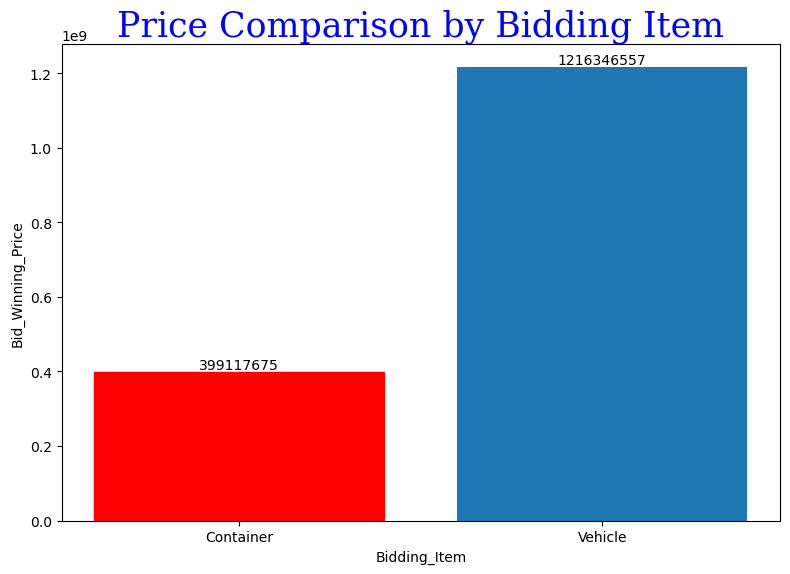

In [8]:
# IT SHOWS THAT THE NIGERIAN CUSTOMS MADE OVER THREE HUNDRED MILLION NAIRA FROM THE AUCTION OF CONTAINERS
# AND OVER A BILLION IN THE AUCTION OF USED VEHICLES

# Showing the price comparision by bidding items
# grouping all the items in the bidding item column by the bid winning price 
grouped_items = auction_visual.groupby('Bidding_Item')['Bid_Winning_Price'].sum().reset_index()

# Plotting the bar chart by specifying it size
plt.figure(figsize=(8, 6))

# Plotting the bars with different colors and labels
bars = plt.bar(grouped_items['Bidding_Item'], grouped_items['Bid_Winning_Price'])
bars[0].set_color('red')
font1 = {'family':'serif','color':'blue','size':25}


# Add labels on top of each bar showing the sum of prices of each bidding item
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom')

# Add labels and title to the different axis
plt.xlabel('Bidding_Item')
plt.ylabel('Bid_Winning_Price')
plt.title('Price Comparison by Bidding Item', fontdict = font1)

# Show the plot
plt.tight_layout()
plt.show()

In [22]:
# Show the unique counts of each bidding item
auction_visual['Bidding_Item'].value_counts()

Bidding_Item
Vehicle      1124
Container      81
Name: count, dtype: int64

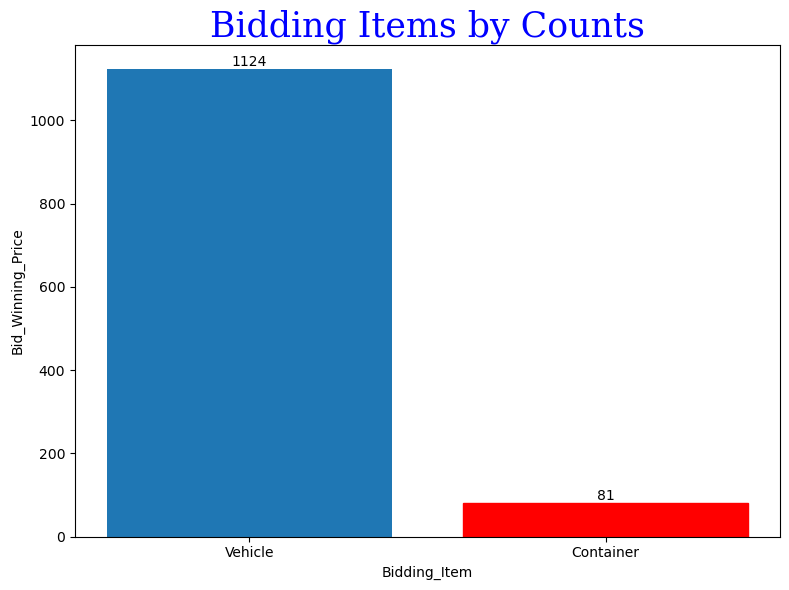

In [28]:
# THE TOTAL VEHICLE AUCTIONED IS AT 1,124 AND CONTAINERS IS AT 81

# Get the count of each bidding item
bidding_counts = auction_visual['Bidding_Item'].value_counts().reset_index()
bidding_counts.columns = ['Bidding_Item', 'Count'] # count the different items in the bidding item column

# Plotting the bar chart by specifying it size
plt.figure(figsize=(8, 6))

# plot a bar chart
bars = plt.bar(bidding_counts['Bidding_Item'], bidding_counts['Count'])
bars[1].set_color('red')
font1 = {'family':'serif','color':'blue','size':25}

# Add labels on top of each bar showing the count of each bidding item
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom')

#  Add labels and title to the different axis
plt.xlabel('Bidding_Item')
plt.ylabel('Bid_Winning_Price')
plt.title('Bidding Items by Counts', fontdict = font1)

# Show the plot
plt.tight_layout()
plt.show()

In [23]:
# Show the unique counts of each transmission type
auction_visual['Transmission_Type'].value_counts()

Transmission_Type
Automatic_Vehicle    1111
Container_Like         81
Manual_Vehicle         13
Name: count, dtype: int64

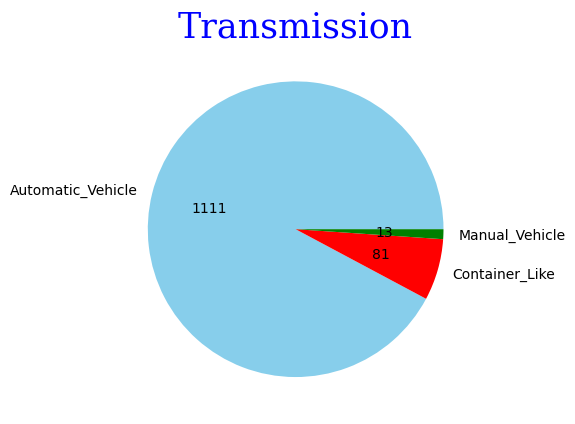

In [36]:
# WE CAN SEE THAT MOST OF THE VEHICLES IMPORTED INTO NIGERIA ARE AUTOMATIC VEHICLES


# Use value_counts to get the counts of each category
transmission_counts = auction_visual['Transmission_Type'].value_counts()

# Function to format the autopct to show the count instead of a percentage and to get the unique count (absolute value)
# of each item in the Transmission type column in a pie chart
def absolute_value(val):
    t = int(val / 100 * transmission_counts.sum())
    return f'{t}'

# give your slices colors
colors = ['skyblue', 'red', 'green']
# format the headers
font1 = {'family':'serif','color':'blue','size':25}

# Create the pie chart
plt.pie(transmission_counts, labels = transmission_counts.index, autopct=absolute_value, colors=colors)

# title
plt.title('Transmission',  fontdict = font1)

# Show the plot
plt.show()

In [37]:
# Show the unique counts of each Reference Number
auction_visual['Reference_Number'].value_counts()

Reference_Number
NCS/01TC/OVT/02/2024/522     2
NCS/PTML/OVT/04/2024/856     2
NCS/PTML/OVT/02/2024/363     2
NCS/PTML/OVT/01/2024/258     2
NCS/01TC/OVT/02/2024/442     2
                            ..
NCS/PTML/OVT/01/2024/290     1
NCS/PTML/OVT/01/2024/287     1
NCS/PTML/OVT/01/2024/286     1
NCS/PTML/OVT/01/2024/284     1
NCS/TCIP/OVT/08/2024/1182    1
Name: count, Length: 1198, dtype: int64

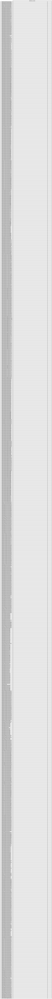

In [46]:
# FROM THE REFERENCE NUMBER COLUMN COUNT, I CAN SEE THAT THE BID IS ACTUALLY A TOUGH AND TRUE ONE
# ONLY SEVEN REFERENCE NUMBERS HAVE ACTUALLY WON A BID TWICE
# WITH THE REMAINING REFERENCE NUMBERS HAVING JUST WON JUST ONCE.
# DUE TO ANNOYMITY, REFERENCE NUMBERS ARE UNIQUE NUMBERS ISSUED TO EACH WINNING BIDDER THE FIRST TIME
# IF I WIN A BID FOR EXAMPLE, THEN I WILL BE GIVEN A REFERENCE NUMBER.
# FOR EXAMPLE THE VERY FIRST WINNER OF THE AUCTION WAS GIVEN A REFERENCE NUMBER OF NCS/PTML/OVT/01/24/1
# ONLY WINNERS HAVE REFERENCE NUMBERS

# Get the count of each bidding item
reference_counts = auction_visual['Reference_Number'].value_counts()


# Create a bar plot
plt.figure(figsize=(10,6))
plt.table(cellText = reference_counts.values.reshape(-1,1), rowLabels = reference_counts.index, 
          colLabels = ['reference_counts'], loc ='center')

plt.axis('off')

# Show the plot with the table
plt.show()

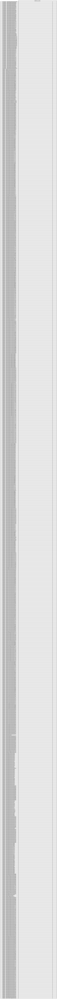

In [13]:
reference_counts = auction_visual.groupby(['Bidding_Item'])['Reference_Number'].value_counts()


# Create a bar plot
plt.figure(figsize=(10,6))
plt.table(cellText = reference_counts.values.reshape(-1,1), rowLabels = reference_counts.index, 
          colLabels = ['reference_counts'], loc ='center')

plt.axis('off')

# Show the plot with the table
plt.show()

In [54]:
# Show the unique counts of each Reference Number
# Lesson learned, Do not name a column value 'None' because it is
# A python function and python cannot identify it
# But it would not affect the values count of your column
# but it wont also show it.

# CHANGE THE NONE TO NON_VEHICLE IN THE FUEL TYPE COLUMN TO SEE THE NON_VEHICLE COUNT
# BEFORE RUNNING THE CODE BELOW TO MAKE A CORRECTION

auction_visual['Fuel_Type'].value_counts()

Fuel_Type
Petrol_Vehicle    1118
Diesel_Vehicle       6
Name: count, dtype: int64

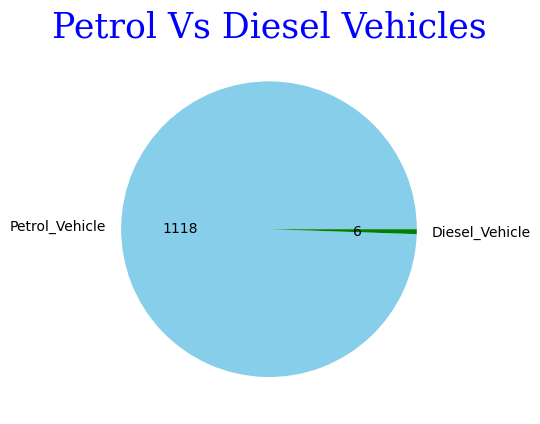

In [56]:
# WE CAN SEE THAT MOST OF THE VEHICLES THAT ARE BEING WON ARE VEHICLES THAT USE PETROL
# RATHER THAN DIESEL WHICH CAN BE ATTRIBUTED TO THE CHEAPER COST OF FUEL PURCHASE FOR THE FORMER
# DIESEL IS VERY EXPENSIVE IN NIGERIA

# Do not name a column value 'None' when using python.

# Use value_counts to get the counts of each category
Vehicle_Type_Counts = auction_visual['Fuel_Type'].value_counts()

# Function to format the autopct to show the count instead of a percentage and to get the unique count (absolute value)
# of each item in the Transmission type column in a pie chart
def absolute_value(val):
    v = int(val / 100 * Vehicle_Type_Counts.sum())
    return f'{v}'

# give your slices colors
colors = ['skyblue', 'green']
# format the headers
font1 = {'family':'serif','color':'blue','size':25}

# Create the pie chart
plt.pie(Vehicle_Type_Counts, labels = Vehicle_Type_Counts.index, autopct=absolute_value, colors=colors)

# title
plt.title('Petrol Vs Diesel Vehicles',  fontdict = font1)

# Show the plot
plt.show()

# AFTER MAKIING THE NECESSARY CHANGES IN THE FUEL TYPE COLUMN RUN THE CODES BELOW

In [ ]:
# Make the neccesarry changes in the fuel type column before running

# auction_visual['Fuel_Type'].value_counts()

In [ ]:
# MAKE THE CHANGES IN THE FUEL TYPE (NONE TO NON_VEHICLE) COLUMN BEFORE RUNNING THIS CODE


# WE CAN SEE THAT MOST OF THE VEHICLES THAT ARE BEING WON ARE VEHICLES THAT USE PETROL
# RATHER THAN DIESEL WHICH CAN BE ATTRIBUTED TO THE CHEAPER COST OF FUEL PURCHASE FOR THE FORMER
# DIESEL IS VERY EXPENSIVE IN NIGERIA

# Do not name a column value 'None' when using python.

# Use value_counts to get the counts of each category
# Vehicle_Type_Counts = auction_visual['Fuel_Type'].value_counts()

# Function to format the autopct to show the count instead of a percentage and to get the unique count (absolute value)
# of each item in the Transmission type column in a pie chart
# def absolute_value(val):
 #   v = int(val / 100 * Vehicle_Type_Counts.sum())
 #   return f'{v}'

# give your slices colors
#colors = ['skyblue', 'red', 'green']
# format the headers
# font1 = {'family':'serif','color':'blue','size':25}

# Create the pie chart
# plt.pie(Vehicle_Type_Counts, labels = Vehicle_Type_Counts.index, autopct=absolute_value, colors=colors)

# title
# plt.title('Petrol Vs Diesel Vehicles',  fontdict = font1)

# Show the plot
# plt.show()